# **VISUAL QUESTION ANSWERING SYSTEM USING DEEP LEARNING TECHNIQUES**

# **DATA ACQUISITION**

In [1]:
import numpy as np
import pandas as pd
import matplotlib
matplotlib.use(u'nbAgg')
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
# import spacy
import scipy.io
import gc
from sklearn.preprocessing import LabelEncoder
import pickle
import json
from tensorflow.keras.models import Sequential
from tensorflow.python.keras.layers.core import Dense, Dropout, Activation, Reshape
from tensorflow.keras import Input
#from keras.layers.recurrent import LSTM
from tensorflow.keras.layers import concatenate
from tensorflow.python.keras.layers.merge import Concatenate
from tensorflow.keras.models import model_from_json, Model,Sequential
from tensorflow.keras.utils import plot_model
from collections import defaultdict
import operator
from tensorflow.python.keras.utils import np_utils, generic_utils
#from progressbar import Bar, ETA, Percentage, ProgressBar
from itertools import zip_longest
from tensorflow.keras.models import load_model
from sklearn.feature_extraction.text import TfidfVectorizer,CountVectorizer
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.text import Tokenizer,one_hot
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.python.keras.layers import LSTM, BatchNormalization,concatenate,Flatten,Embedding,Dense,Dropout,MaxPooling2D,Reshape,CuDNNLSTM,SpatialDropout1D
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras import Model,Input
from tensorflow.python.keras.layers.convolutional import Conv2D,Conv1D
from tensorflow.keras import initializers 
from keras.preprocessing.image import ImageDataGenerator
from keras.preprocessing import image
import tensorflow.keras.backend as k
from sklearn.metrics import roc_auc_score
import tensorflow as tf
from tensorflow.keras.callbacks import Callback, EarlyStopping,ModelCheckpoint,TensorBoard
from time import time
from tensorflow.keras.regularizers import l1,l2,l1_l2
from scipy.sparse import hstack
import tensorflow.keras
from tqdm import tqdm
from datetime import datetime
# import cv2
%matplotlib inline
#%tensorflow_version 1.x

Using TensorFlow backend.


In [ ]:
#!pip install tensorflow==2.1.0

In [2]:
tf.__version__

'2.2.0-rc3'

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [ ]:
!cp drive/'My Drive'/v2_OpenEnded_mscoco_train2014_questions.json .
!cp drive/'My Drive'/v2_mscoco_train2014_annotations.json .

In [ ]:
que = json.load(open('v2_OpenEnded_mscoco_train2014_questions.json', 'r'))
ans = json.load(open('v2_mscoco_train2014_annotations.json', 'r'))

In [6]:
print("Total no. of question are",len(que['questions']))
print("Total no. of answers are",len(ans['annotations']))

Total no. of question are 443757
Total no. of answers are 443757


In [7]:
cd drive/My Drive

/content/drive/My Drive


In [ ]:
from os import listdir
image_dir = 'train2014'
images= listdir(image_dir)

In [ ]:
print("Total number of images present in the dataset are", len(images))

Total number of images present in the dataset are 165408


In [ ]:
# CONVERTING DATA FROM JASON TO PANDAS DATAFRAME
subtype='train2014'
data=[]
imdir='%s/COCO_%s_%012d.jpg'
for i in tqdm(range(len(ans['annotations']))):
    answ=ans['annotations'][i]['multiple_choice_answer']
    im_path=imdir%(subtype,subtype,ans['annotations'][i]['image_id'])
    ques=que['questions'][i]['question']
    data.append({'im_path':im_path,'ques':ques,'answ':answ})

100%|██████████| 443757/443757 [00:00<00:00, 482279.03it/s]


In [ ]:
total_data=pd.DataFrame(data)
total_data.head()

,im_path,ques,answ
0,train2014/COCO_train2014_000000458752.jpg,What is this photo taken looking through?,net
1,train2014/COCO_train2014_000000458752.jpg,What position is this man playing?,pitcher
2,train2014/COCO_train2014_000000458752.jpg,What color is the players shirt?,orange
3,train2014/COCO_train2014_000000458752.jpg,Is this man a professional baseball player?,yes
4,train2014/COCO_train2014_000000262146.jpg,What color is the snow?,white


In [ ]:
total_data.shape

(443757, 3)

# **PREPROCESSING**

In [ ]:
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [ ]:
preprocessed_questions = []
for question in tqdm(total_data['ques'].values):
    que = decontracted(question) 
    preprocessed_questions.append(que.lower().strip())

100%|██████████| 443757/443757 [00:04<00:00, 107594.44it/s]


In [ ]:
total_data['ques']=preprocessed_questions
total_data.head(2)

,im_path,ques,answ
0,train2014/COCO_train2014_000000458752.jpg,what is this photo taken looking through?,net
1,train2014/COCO_train2014_000000458752.jpg,what position is this man playing?,pitcher


In [ ]:
total_data=total_data.reset_index(drop=True)

In [ ]:
#total_data=total_data.sample(frac=0.001).reset_index(drop=True)

In [ ]:
#total_data.shape

In [ ]:
a=pd.DataFrame(total_data['answ'].value_counts()[:2])
ind=list(a.index)

In [ ]:
top_data=pd.DataFrame()
for i in tqdm(ind):
    top_data1=total_data[total_data.answ == i]
    top_data=pd.concat([top_data,top_data1],ignore_index=True)

100%|██████████| 2/2 [00:00<00:00, 10.16it/s]


In [ ]:
print("Shape of data after considering top 2 answers is",top_data.shape)

Shape of data after considering top 2 answers is (167494, 3)


In [ ]:
top_data=top_data.sample(40000).reset_index(drop=True)

In [ ]:
print("Shape of data after considering top 2 answers is",top_data.shape)

Shape of data after considering top 2 answers is (40000, 3)


In [ ]:
top_data.head(2)

,im_path,ques,answ
0,train2014/COCO_train2014_000000009878.jpg,are there any females in this photo?,yes
1,train2014/COCO_train2014_000000481571.jpg,are there construction workers on the road?,no


# **Exploratory Data Analysis**

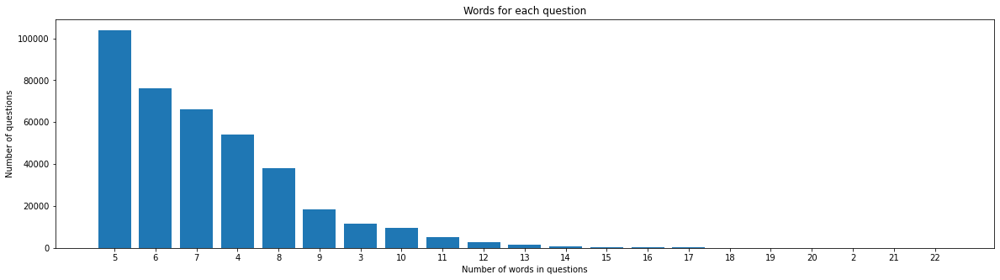

In [ ]:
word_count = top_data['ques'].str.split().apply(len).value_counts()
word_dict = dict(word_count)
word_dict = dict(sorted(word_dict.items(), key=lambda kv: kv[1],reverse=True))


ind = np.arange(len(word_dict))
plt.figure(figsize=(20,5))
p1 = plt.bar(ind, list(word_dict.values()))

plt.ylabel('Number of questions')
plt.xlabel('Number of words in questions')
plt.title('Words for each question')
plt.xticks(ind, list(word_dict.keys()))
plt.show()

Observations:
1. Most of the question length is 4 to 8 words.
2. Maximum length of question is 22 words.

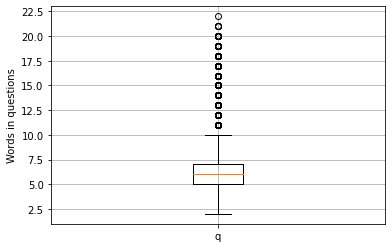

In [ ]:
que_word_count = top_data['ques'].str.split().apply(len)
plt.boxplot(que_word_count)
plt.xticks([1],'questions')
plt.ylabel('Words in questions')
plt.grid()
plt.show()

Observations:
1. 50% questions have 5 to 8 words.
2. Most of the questions have less than 10 words although there are few questions having greater than 10 words.

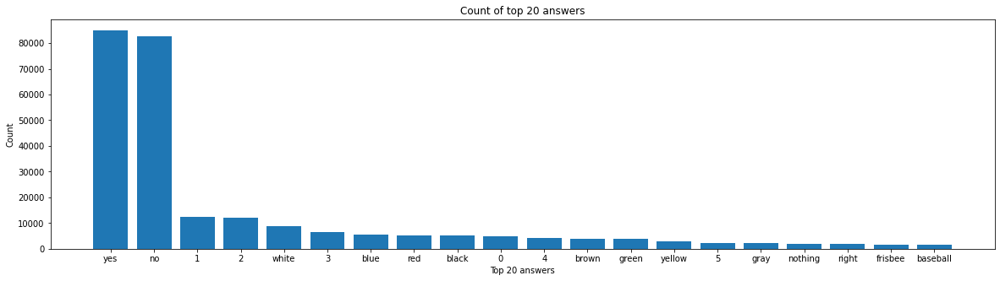

In [ ]:
word_count = top_data['answ'].value_counts()[0:20]
word_dict = dict(word_count)
word_dict = dict(sorted(word_dict.items(), key=lambda kv: kv[1],reverse=True))


ind = np.arange(len(word_dict))
plt.figure(figsize=(20,5))
p1 = plt.bar(ind, list(word_dict.values()))

plt.ylabel('Count')
plt.xlabel('Top 20 answers')
plt.title('Count of top 20 answers')
plt.xticks(ind, list(word_dict.keys()))
plt.show()

Observations:
1. Very large proportion of the answer have yes/no answer.
2. Apart from binary answers  most common answes constists of either colors or numbers

In [ ]:
cnt1= top_data[top_data['answ']=='yes']['answ'].count()+top_data[top_data['answ']=='no']['answ'].count()
cnt2= len(top_data)-cnt1
print("Total no of binary(yes/no) answers  :",cnt1)
print("% of binary answers                 :",np.round(cnt1/len(top_data)*100,2))
print("Total no of multiple answers        :",cnt2)
print("% of multiple answers               :",np.round(cnt2/len(top_data)*100,2))

Total no of binary('yes'/no) answers: 167494
% of binary answers                 : 43.15
Total no of multiple answers        : 220664
% of multiple answers               : 56.85


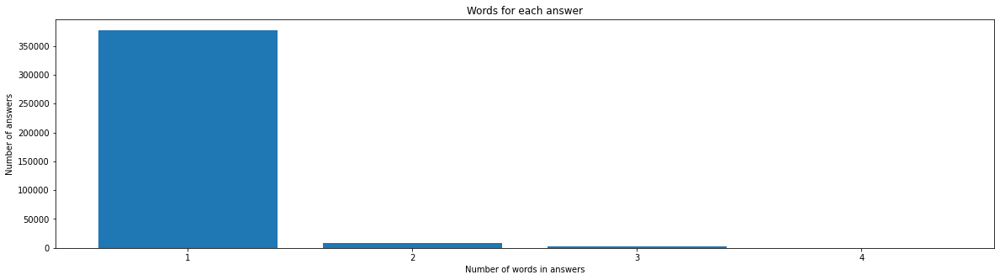

In [ ]:
word_count = top_data['answ'].str.split().apply(len).value_counts()
word_dict = dict(word_count)
word_dict = dict(sorted(word_dict.items(), key=lambda kv: kv[1],reverse=True))


ind = np.arange(len(word_dict))
plt.figure(figsize=(20,5))
p1 = plt.bar(ind, list(word_dict.values()))

plt.ylabel('Number of answers')
plt.xlabel('Number of words in answers')
plt.title('Words for each answer')
plt.xticks(ind, list(word_dict.keys()))
plt.show()

Observations:
1. Almost 95% answers are one word answers although few questions have 2,3 and 4 word answers.

# **TRAIN-TEST SPLITTING**

In [ ]:
y = top_data['answ']
#top_data.drop(['answ'],axis=1,inplace=True)

In [ ]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(top_data,y,test_size=0.3,stratify=y,random_state=42)

In [ ]:
x_train.to_csv('x_train.csv')
x_test.to_csv('x_test.csv')
y_train.to_csv('y_train.csv')
y_test.to_csv('y_test.csv')

In [ ]:
x_train=pd.read_csv('x_train.csv')
x_test=pd.read_csv('x_test.csv')
y_train=pd.read_csv('y_train.csv')
y_test=pd.read_csv('y_test.csv')

In [ ]:
y_train.drop(['Unnamed: 0'],axis=1,inplace=True)

In [ ]:
y_test.drop(['Unnamed: 0'],axis=1,inplace=True)

In [ ]:
#!pip uninstall keras-preprocessing

In [ ]:
#pip install git+https://github.com/keras-team/keras-preprocessing.git

In [ ]:
from keras_preprocessing.image import ImageDataGenerator

In [ ]:
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.preprocessing.image import load_img,img_to_array

# **ENCODING QUESTIONS**

In [ ]:
def textokenizer(text):
  max_length = 24
  tok = Tokenizer()
  tok.fit_on_texts(x_train['ques'])
  vocab_size = len(tok.word_index) + 1
  #print('Total unique words in the x_train',vocab_size)
  encoded_text = tok.texts_to_sequences(text)
  padded_text = pad_sequences(encoded_text, maxlen=max_length)  #padding zeros at the begining of each question so that each sequence will have same length
  #print(padded_text.shape)
  return padded_text, tok

In [ ]:
#Each token is represented using 300-dim vector using pre-trained GloVe representation.
with open('glove_vectors', 'rb') as f:
    model = pickle.load(f)
    glove_words =  set(model.keys())
    
# for train
_,tok = textokenizer(x_train['ques'])
vocab_size = len(tok.word_index) + 1
embedding_matrix_train = np.zeros((vocab_size, 300))
for word, i in tok.word_index.items():
    if word in glove_words:
        embedding_vector = model[word]
        embedding_matrix_train[i] = embedding_vector

In [41]:
print("embedding matrix shape",embedding_matrix_train.shape)

embedding matrix shape (5964, 300)


# **ENCODING ANSWERS**

In [ ]:
def optokens(classes):
  from sklearn.preprocessing import OneHotEncoder
  ohe=OneHotEncoder(handle_unknown='ignore')
  ohe.fit(y_train.values.reshape(-1,1))
  optoken=ohe.transform(classes.values.reshape(-1,1)).toarray()
  return optoken, ohe

In [ ]:
_,ohe=optokens(x_train['answ'])

In [ ]:
pickle.dump(ohe,open('ohe.pkl','wb'))

# **CREATING DATASET**

In [ ]:
model = VGG16(weights='imagenet')
feature_model = Model(inputs=model.inputs, outputs=model.layers[-2].output)

553467904/553467096 [==============================] - 6s 0us/step


In [ ]:
len(set(top_data['im_path'].tolist()))

82575

In [ ]:
def parse_function(filename):
    image_string = tf.io.read_file(filename)
    #Don't use tf.image.decode_image, or the output shape will be undefined
    image = tf.image.decode_jpeg(image_string, channels=3)
    #This will convert to float values in [0, 1]
    image = tf.image.convert_image_dtype(image, tf.float32)
    image = tf.image.resize(image, [224, 224])
    return  image, filename

In [ ]:
img_fl=sorted(set(top_data['im_path'].tolist()))
img_data_tr=tf.data.Dataset.from_tensor_slices(img_fl)
img_data_tr=img_data_tr.map(parse_function,num_parallel_calls=tf.data.experimental.AUTOTUNE).batch(32).prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
for img, path in tqdm(img_data_tr):
  batch_features = feature_model(img)
  #batch_features = tf.reshape(batch_features,(batch_features.shape[0], -1, batch_features.shape[3]))

  for bf, p in zip(batch_features, path):
    path_of_feature = p.numpy().decode("utf-8")
    np.save(path_of_feature, bf.numpy())


0it [00:00, ?it/s]
1it [00:02,  2.15s/it]
2it [00:03,  1.79s/it]
3it [00:04,  1.53s/it]
4it [00:05,  1.37s/it]
5it [00:06,  1.25s/it]
6it [00:07,  1.17s/it]
7it [00:07,  1.12s/it]
8it [00:08,  1.07s/it]
9it [00:09,  1.05s/it]
10it [00:10,  1.02s/it]
11it [00:11,  1.03s/it]
12it [00:12,  1.02s/it]
13it [00:13,  1.01s/it]
14it [00:14,  1.00s/it]
15it [00:15,  1.00s/it]
16it [00:16,  1.04it/s]
17it [00:17,  1.02it/s]
18it [00:18,  1.02it/s]
19it [00:19,  1.02it/s]
20it [00:20,  1.03it/s]
21it [00:21,  1.01it/s]
22it [00:22,  1.05it/s]
23it [00:23,  1.03it/s]
24it [00:24,  1.01it/s]
25it [00:25,  1.03it/s]
26it [00:26,  1.01it/s]
27it [00:27,  1.01it/s]
28it [00:28,  1.00it/s]
29it [00:29,  1.02it/s]
30it [00:30,  1.04it/s]
31it [00:31,  1.01s/it]
32it [00:32,  1.01it/s]
33it [00:33,  1.01it/s]
34it [00:34,  1.03it/s]
35it [00:35,  1.06it/s]
36it [00:36,  1.07it/s]
37it [00:37,  1.06it/s]
38it [00:38,  1.07it/s]
39it [00:39,  1.09it/s]
40it [00:39,  1.09it/s]
41it [00:40,  1.07it/s]
42it 

In [ ]:
ques_train , _ =textokenizer(x_train['ques'])
answ_train , _ =optokens(x_train['answ'])

In [ ]:
ques_train=ques_train.tolist()
answ_train=answ_train.tolist()

In [ ]:
def map_func(img_name, question):
  img_tensor = np.load(img_name.decode('utf-8')+'.npy')
  return img_tensor, question

In [ ]:
img_fl=x_train['im_path'].tolist()
train_dataset = tf.data.Dataset.from_tensor_slices((img_fl, ques_train))

# Use map to load the numpy files in parallel
train_dataset = train_dataset.map(lambda item1, item2: tf.numpy_function(
          map_func, [item1, item2], [tf.float32, tf.int32]),
          num_parallel_calls=tf.data.experimental.AUTOTUNE)
op_train_dataset = tf.data.Dataset.from_tensor_slices(answ_train)
train_dataset=tf.data.Dataset.zip((train_dataset,op_train_dataset))
train_dataset = train_dataset.batch(1000)
train_dataset = train_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

In [ ]:
ques_test,_=textokenizer(x_test['ques'])
answ_test,_=optokens(x_test['answ'])

In [ ]:
ques_test=ques_test.tolist()
answ_test=answ_test.tolist()

In [ ]:
img_fl_te=x_test['im_path'].tolist()
test_dataset = tf.data.Dataset.from_tensor_slices((img_fl_te, ques_test))
# Use map to load the numpy files in parallel
test_dataset = test_dataset.map(lambda item1, item2: tf.numpy_function(
          map_func, [item1, item2], [tf.float32, tf.int32]),
          num_parallel_calls=tf.data.experimental.AUTOTUNE)
op_test_dataset = tf.data.Dataset.from_tensor_slices(answ_test)
test_dataset=tf.data.Dataset.zip((test_dataset,op_test_dataset))
test_dataset = test_dataset.batch(1000)
test_dataset = test_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

In [ ]:
%who

Activation	 BatchNormalization	 Callback	 Concatenate	 Conv1D	 Conv2D	 CountVectorizer	 CuDNNLSTM	 Dense	 
Dropout	 EarlyStopping	 Embedding	 Flatten	 Input	 LSTM	 LabelEncoder	 MaxPooling2D	 Model	 
ModelCheckpoint	 Reshape	 Sequential	 SpatialDropout1D	 TensorBoard	 TfidfVectorizer	 Tokenizer	 X_test	 X_train	 
concatenate	 defaultdict	 drive	 embedding_matrix_train	 files	 gc	 generic_utils	 he_normal	 he_uniform	 
hstack	 json	 k	 l1	 l1_l2	 l2	 load_model	 matplotlib	 model_from_json	 
np	 np_utils	 one_hot	 operator	 pad_sequences	 pd	 pickle	 plot_model	 plt	 
roc_auc_score	 scipy	 sns	 tensorflow	 test_features	 tf	 time	 train_features	 train_test_split	 
warnings	 y_test11	 y_train11	 zip_longest	 


# **MODEL 1** 

In [ ]:
#IMAGE MODEL
im_input = Input(shape=(4096,), name = "im_input")
#flat = Flatten()(im_input)
image_model=Dense(1024,activation='relu',kernel_initializer=initializers.he_normal(seed=42))(im_input)
image_model=Model(inputs=im_input,outputs=image_model)
image_model.summary()

Model: "model_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
im_input (InputLayer)        [(None, 4096)]            0         
_________________________________________________________________
dense_8 (Dense)              (None, 1024)              4195328   
Total params: 4,195,328
Trainable params: 4,195,328
Non-trainable params: 0
_________________________________________________________________


In [ ]:
max_length=24
vocab_size=embedding_matrix_train.shape[0]

In [ ]:
#QUESTION MODEL
from tensorflow.python.keras.layers import LSTM
ques_input = Input(shape=(max_length,), name = "ques_input")
e1 =Embedding(vocab_size, 300, weights=[embedding_matrix_train], input_length=max_length,trainable=False)(ques_input)
l1= LSTM(64,kernel_initializer=initializers.he_normal(seed=42),kernel_regularizer=l2(0.001),return_sequences=True)(e1)
l2= LSTM(64,kernel_initializer=initializers.he_normal(seed=42),kernel_regularizer=l2(0.001),return_sequences=True)(l1)
#l1= LeakyReLU(alpha = 0.3)(l1)
f1= Flatten(name='flatten_1')(l2)
question_model=Dense(1024,activation='relu',kernel_initializer=initializers.he_normal(seed=42))(f1)
question_model = Model(inputs=ques_input, outputs=question_model)
question_model.summary()

Model: "model_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
ques_input (InputLayer)      [(None, 24)]              0         
_________________________________________________________________
embedding_3 (Embedding)      (None, 24, 300)           1789200   
_________________________________________________________________
lstm_4 (LSTM)                (None, 24, 64)            93440     
_________________________________________________________________
lstm_5 (LSTM)                (None, 24, 64)            33024     
_________________________________________________________________
flatten_1 (Flatten)          (None, 1536)              0         
_________________________________________________________________
dense_9 (Dense)              (None, 1024)              1573888   
Total params: 3,489,552
Trainable params: 1,700,352
Non-trainable params: 1,789,200
_________________________________________

In [ ]:
#COMBINING FEATURES AND MAKING FINAL MODEL FOR PREDICTION
from tensorflow.keras.layers import multiply
input_model=multiply([image_model.layers[-1].output,question_model.layers[-1].output])
d1=BatchNormalization()(input_model)
d1 = Dropout(0.5)(d1)
d1=Dense(1000,activation='relu',kernel_initializer=initializers.he_normal(seed=42))(d1)
final_output = Dense(2, kernel_initializer=initializers.he_normal(seed=42),activation='softmax')(d1)
final_model = Model(inputs=[im_input,ques_input], outputs=final_output)
print(final_model.summary())

Model: "model_6"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
ques_input (InputLayer)         [(None, 24)]         0                                            
__________________________________________________________________________________________________
embedding_3 (Embedding)         (None, 24, 300)      1789200     ques_input[0][0]                 
__________________________________________________________________________________________________
lstm_4 (LSTM)                   (None, 24, 64)       93440       embedding_3[0][0]                
__________________________________________________________________________________________________
lstm_5 (LSTM)                   (None, 24, 64)       33024       lstm_4[0][0]                     
____________________________________________________________________________________________

In [ ]:
from tensorflow.keras.optimizers import Adam
!rm -rf ./logs1/

In [51]:
checkpoint = ModelCheckpoint("basic_model1.h5",
                             monitor="val_loss",
                             mode="min",
                             save_best_only = True,
                             verbose=1)
earlystop= EarlyStopping(monitor = 'val_loss', 
                            mode="min",
                            min_delta = 0, 
                            patience = 5,
                            verbose = 1)

tensorboard = TensorBoard(log_dir='logs1',histogram_freq=1,write_grads=True)

callbacks = [checkpoint,earlystop,tensorboard]

In [ ]:
final_model=load_model('/content/drive/My Drive/basic_model1.h5')

In [54]:
final_model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy']) 
h1 = final_model.fit(train_dataset, epochs=10, verbose=1,workers=-1, use_multiprocessing=-1,callbacks=callbacks, validation_data=test_dataset)

Epoch 1/10
28/28 [==============================] - ETA: 0s - loss: 0.6850 - accuracy: 0.6115  
Epoch 00001: val_loss improved from inf to 0.90766, saving model to basic_model1.h5
28/28 [==============================] - 3246s 116s/step - loss: 0.6850 - accuracy: 0.6115 - val_loss: 0.9077 - val_accuracy: 0.5062
Epoch 2/10
28/28 [==============================] - ETA: 0s - loss: 0.6715 - accuracy: 0.6280 
Epoch 00002: val_loss improved from 0.90766 to 0.78047, saving model to basic_model1.h5
28/28 [==============================] - 544s 19s/step - loss: 0.6715 - accuracy: 0.6280 - val_loss: 0.7805 - val_accuracy: 0.5204
Epoch 3/10
28/28 [==============================] - ETA: 0s - loss: 0.6679 - accuracy: 0.6338 
Epoch 00003: val_loss improved from 0.78047 to 0.73447, saving model to basic_model1.h5
28/28 [==============================] - 545s 19s/step - loss: 0.6679 - accuracy: 0.6338 - val_loss: 0.7345 - val_accuracy: 0.5406
Epoch 4/10
28/28 [==============================] - ETA: 0s

In [55]:
%load_ext tensorboard
%tensorboard --logdir logs1

<IPython.core.display.Javascript object>

In [2]:
import matplotlib.image as mpimg
img1=mpimg.imread('D:/AAIC notes/assign/CS2_Blog/Model 1/hist1.jpg')
img2=mpimg.imread('D:/AAIC notes/assign/CS2_Blog/Model 1/hist2.jpg')
img3=mpimg.imread('D:/AAIC notes/assign/CS2_Blog/Model 1/hist3.jpg')
img4=mpimg.imread('D:/AAIC notes/assign/CS2_Blog/Model 1/hist4.jpg')
img5=mpimg.imread('D:/AAIC notes/assign/CS2_Blog/Model 1/hist5.jpg')
img6=mpimg.imread('D:/AAIC notes/assign/CS2_Blog/Model 1/hist6.jpg')
img7=mpimg.imread('D:/AAIC notes/assign/CS2_Blog/Model 1/hist7.jpg')
img8=mpimg.imread('D:/AAIC notes/assign/CS2_Blog/Model 1/hist8.jpg')

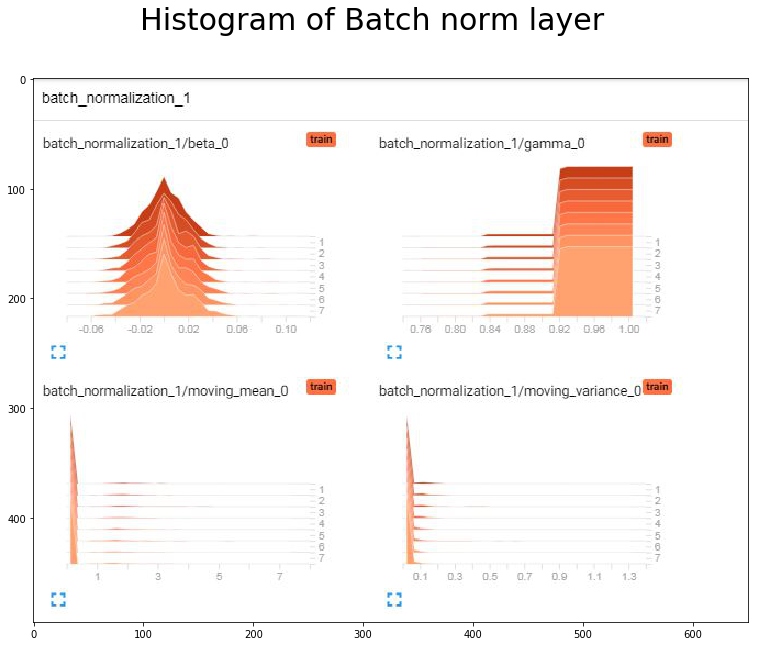

In [3]:
fig=plt.figure(figsize=(20,10))
fig.suptitle('Histogram of Batch norm layer',fontsize=30)
plt.subplot(1,1,1)
plt.imshow(img1)

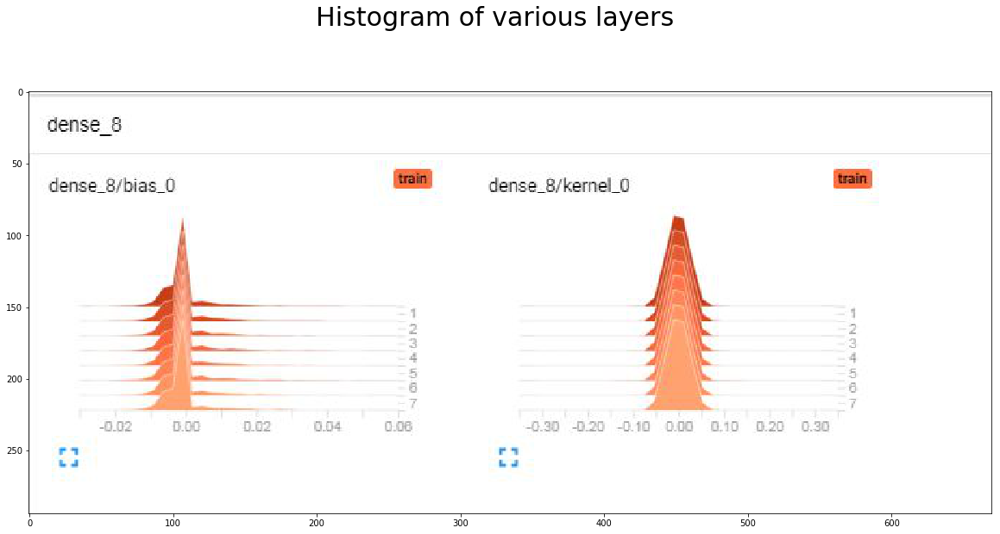

In [4]:
fig=plt.figure(figsize=(20,10))
fig.suptitle('Histogram of various layers',fontsize=30)
plt.subplot(1,1,1)
plt.imshow(img2)

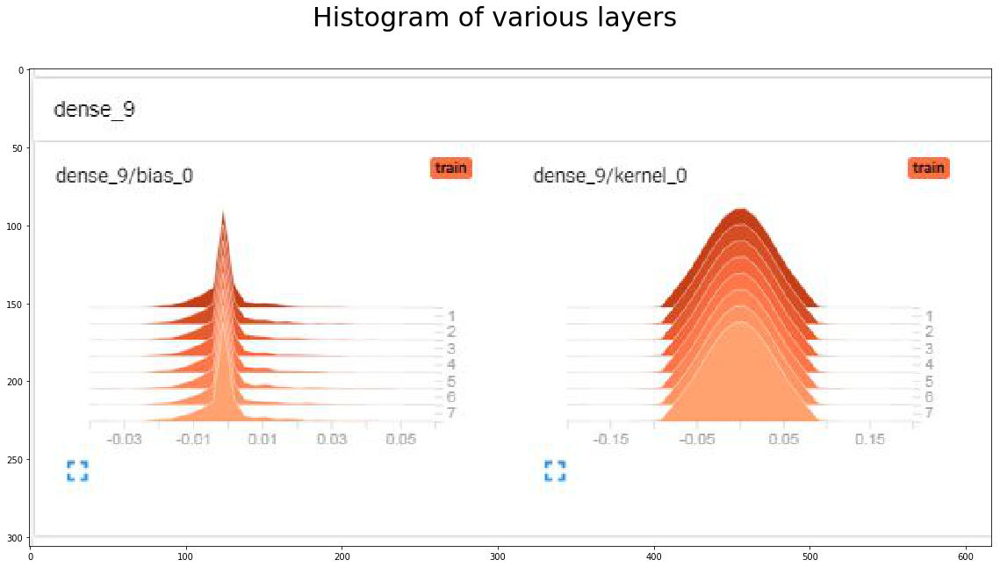

In [5]:
fig=plt.figure(figsize=(20,10))
fig.suptitle('Histogram of various layers',fontsize=30)
plt.subplot(1,1,1)
plt.imshow(img3)

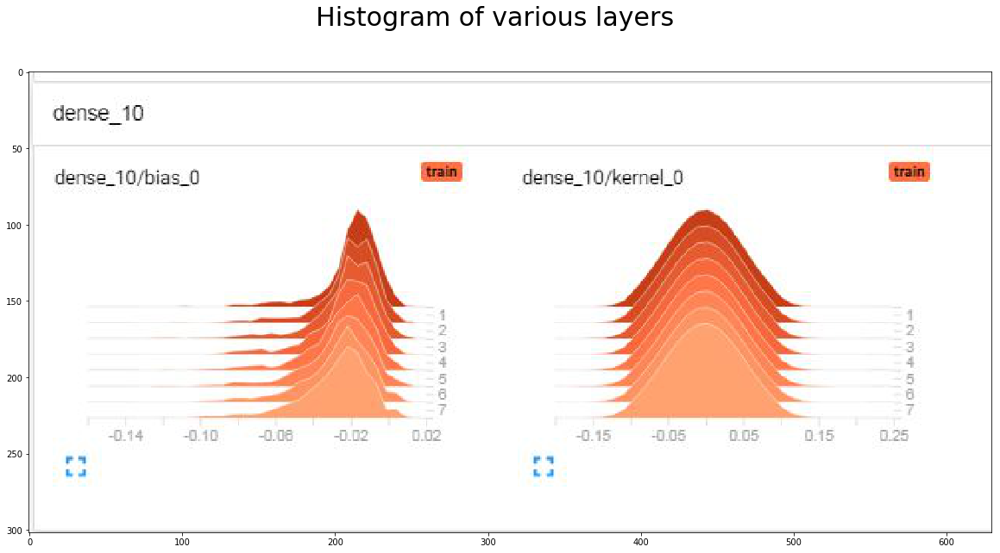

In [6]:
fig=plt.figure(figsize=(20,10))
fig.suptitle('Histogram of various layers',fontsize=30)
plt.subplot(1,1,1)
plt.imshow(img4)

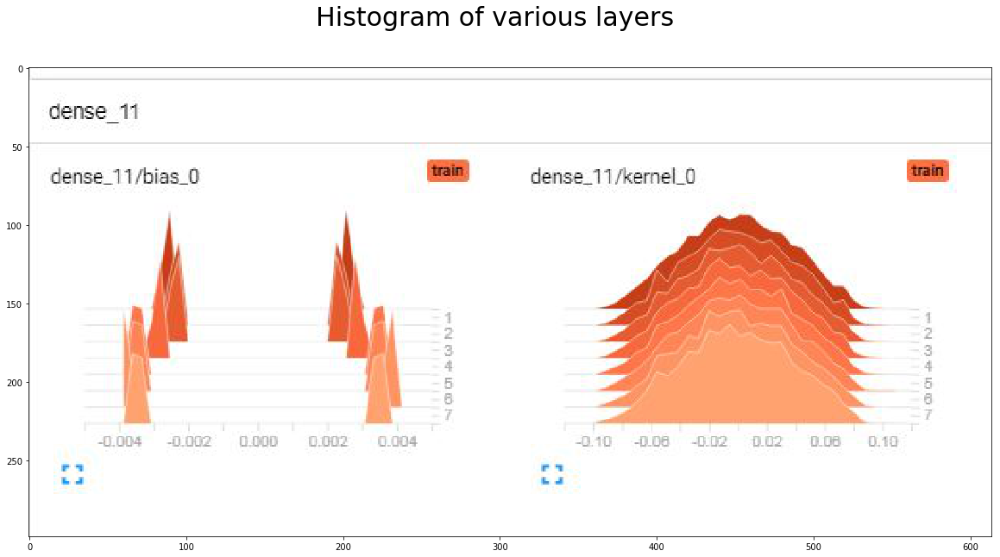

In [7]:
fig=plt.figure(figsize=(20,10))
fig.suptitle('Histogram of various layers',fontsize=30)
plt.subplot(1,1,1)
plt.imshow(img5)

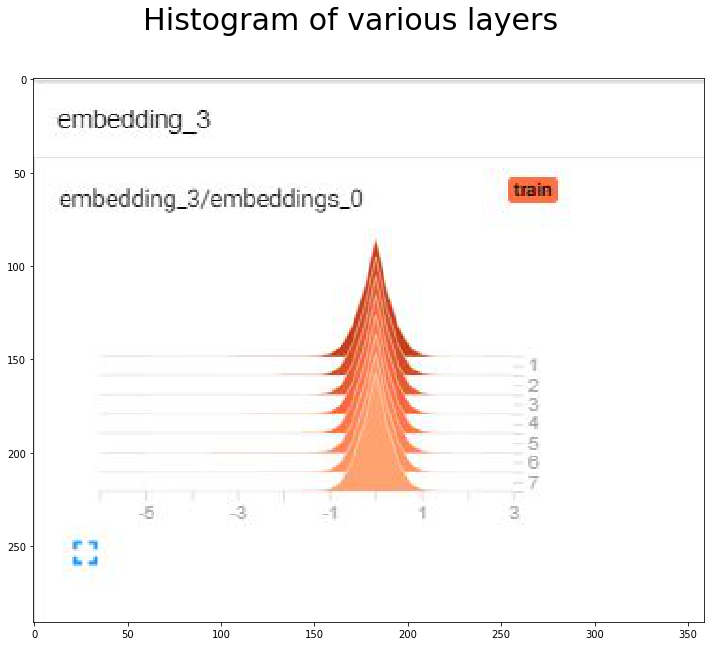

In [8]:
fig=plt.figure(figsize=(20,10))
fig.suptitle('Histogram of various layers',fontsize=30)
plt.subplot(1,1,1)
plt.imshow(img6)

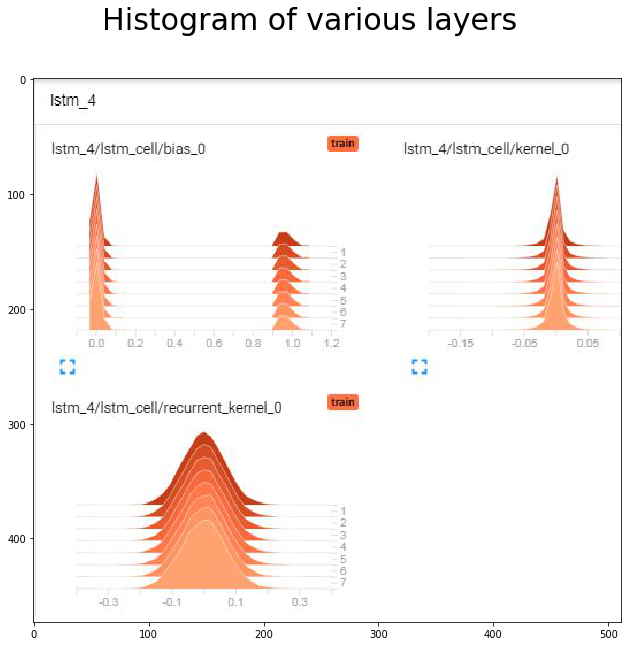

In [9]:
fig=plt.figure(figsize=(20,10))
fig.suptitle('Histogram of various layers',fontsize=30)
plt.subplot(1,1,1)
plt.imshow(img7)

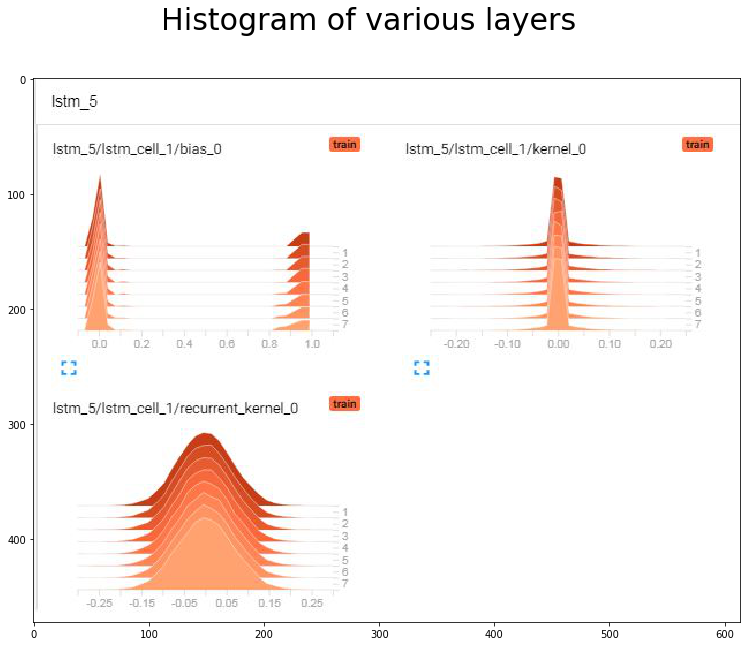

In [10]:
fig=plt.figure(figsize=(20,10))
fig.suptitle('Histogram of various layers',fontsize=30)
plt.subplot(1,1,1)
plt.imshow(img8)

# **MODEL 2**

## **Importing Essential Libraries for Model 2**

In [ ]:
!pip install bert-for-tf2

     |████████████████████████████████| 40kB 38kB/s 
  Created wheel for bert-for-tf2: filename=bert_for_tf2-0.14.4-cp36-none-any.whl size=30114 sha256=39b159b7fdde29d9908a0e559c9009d23adf37b94b24e9b3d91a73e500b89319
  Stored in directory: /root/.cache/pip/wheels/cf/3f/4d/79d7735015a5f523648df90d871ce8e89a7df8185f7703eeab
  Created wheel for py-params: filename=py_params-0.9.7-cp36-none-any.whl size=7302 sha256=4904aab2b625ce61eb0c24f23f98a4df0240b9bd0c6290c5db2534f2c8670bf8
  Stored in directory: /root/.cache/pip/wheels/67/f5/19/b461849a50aefdf4bab47c4756596e82ee2118b8278e5a1980
  Created wheel for params-flow: filename=params_flow-0.8.2-cp36-none-any.whl size=19473 sha256=07ea9d3060df5049e07483676284eceaebe2176bd0285aa3e3b165098b4e5590
  Stored in directory: /root/.cache/pip/wheels/08/c8/7f/81c86b9ff2b86e2c477e3914175be03e679e596067dc630c06
Successfully built bert-for-tf2 py-params params-flow


In [ ]:
import bert
import os

In [ ]:
model_name = "uncased_L-12_H-768_A-12"
model_dir = bert.fetch_google_bert_model(model_name, ".models")
model_ckpt = os.path.join(model_dir, "bert_model.ckpt")

bert_params = bert.params_from_pretrained_ckpt(model_dir)
l_bert = bert.BertModelLayer.from_params(bert_params, name="bert")

Already  fetched:  uncased_L-12_H-768_A-12.zip
already unpacked at: .models/uncased_L-12_H-768_A-12


In [ ]:
!pip install pytorch_pretrained_bert pytorch-nlp

     |████████████████████████████████| 133kB 4.8MB/s 
     |████████████████████████████████| 92kB 13.3MB/s 


## **Preparing Dataset for Model 2**

In [ ]:
from pytorch_pretrained_bert import BertTokenizer

In [ ]:
BertTokenizer=bert.bert_tokenization.FullTokenizer

In [ ]:
tokenizer=BertTokenizer.from_pretrained('bert-base-uncased',do_lower_case=True)

100%|██████████| 231508/231508 [00:00<00:00, 1251578.86B/s]


In [ ]:
train_tokens = list(map(lambda t: ['[CLS]'] + tokenizer.tokenize(t)[:24] + ['[SEP]'], x_train['ques'].tolist()))
test_tokens = list(map(lambda t: ['[CLS]'] + tokenizer.tokenize(t)[:24] + ['[SEP]'], x_test['ques'].tolist()))

In [ ]:
train_tokens_ids = pad_sequences(list(map(tokenizer.convert_tokens_to_ids, train_tokens)), maxlen=24, truncating="post", padding="pre", dtype="int")
test_tokens_ids = pad_sequences(list(map(tokenizer.convert_tokens_to_ids, test_tokens)), maxlen=24, truncating="post", padding="pre", dtype="int")

In [ ]:
img_fl=x_train['im_path'].tolist()
train_dataset = tf.data.Dataset.from_tensor_slices((img_fl, train_tokens_ids))

# Use map to load the numpy files in parallel
train_dataset = train_dataset.map(lambda item1, item2: tf.numpy_function(
          map_func, [item1, item2], [tf.float32, tf.int64]),
          num_parallel_calls=tf.data.experimental.AUTOTUNE)
op_train_dataset = tf.data.Dataset.from_tensor_slices(answ_train)
train_dataset=tf.data.Dataset.zip((train_dataset,op_train_dataset))
train_dataset = train_dataset.batch(1000)
train_dataset = train_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

In [ ]:
img_fl_te=x_test['im_path'].tolist()
test_dataset = tf.data.Dataset.from_tensor_slices((img_fl_te, test_tokens_ids))
# Use map to load the numpy files in parallel
test_dataset = test_dataset.map(lambda item1, item2: tf.numpy_function(
          map_func, [item1, item2], [tf.float32, tf.int64]),
          num_parallel_calls=tf.data.experimental.AUTOTUNE)
op_test_dataset = tf.data.Dataset.from_tensor_slices(answ_test)
test_dataset=tf.data.Dataset.zip((test_dataset,op_test_dataset))
test_dataset = test_dataset.batch(1000)
test_dataset = test_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

## **Model 2 training**

In [ ]:
l_bert.trainable=False

In [ ]:
ques_inp = tf.keras.layers.Input(shape=(24,))
embed = l_bert(ques_inp)

In [ ]:
flat = tf.keras.layers.Flatten()(embed)
image_inp = tf.keras.layers.Input(shape=(4096,))
concat = tf.keras.layers.concatenate([image_inp,flat])
# decoder_out = decoder(encoder_outputs,initial_state=[merged,merged])
out = tf.keras.layers.Dense(2,kernel_initializer=initializers.he_normal(seed=42),activation='softmax')(concat)

In [ ]:
model = tf.keras.Model(inputs = [image_inp,ques_inp],outputs = out)

In [ ]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 24)]         0                                            
__________________________________________________________________________________________________
bert (BertModelLayer)           (None, 24, 768)      108890112   input_1[0][0]                    
__________________________________________________________________________________________________
input_2 (InputLayer)            [(None, 4096)]       0                                            
__________________________________________________________________________________________________
flatten (Flatten)               (None, 18432)        0           bert[0][0]                       
______________________________________________________________________________________________

In [ ]:
model.build(input_shape=[(None,4096),(None,24)])

In [ ]:
bert.load_bert_weights(l_bert, model_ckpt)

Done loading 196 BERT weights from: .models/uncased_L-12_H-768_A-12/uncased_L-12_H-768_A-12/bert_model.ckpt into <bert.model.BertModelLayer object at 0x7fa77ee2d1d0> (prefix:bert). Count of weights not found in the checkpoint was: [0]. Count of weights with mismatched shape: [0]
Unused weights from checkpoint: 
	bert/embeddings/token_type_embeddings
	bert/pooler/dense/bias
	bert/pooler/dense/kernel
	cls/predictions/output_bias
	cls/predictions/transform/LayerNorm/beta
	cls/predictions/transform/LayerNorm/gamma
	cls/predictions/transform/dense/bias
	cls/predictions/transform/dense/kernel
	cls/seq_relationship/output_bias
	cls/seq_relationship/output_weights


[]

In [ ]:
checkpoint = ModelCheckpoint("basic_model4.h5",
                             monitor="val_loss",
                             mode="min",
                             save_best_only = True,
                             verbose=1)

tensorboard = TensorBoard(log_dir='logs1',histogram_freq=1,write_grads=True)

callbacks = [checkpoint,tensorboard]

In [ ]:
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])
h1 = model.fit(train_dataset, epochs=50, verbose=1,callbacks=callbacks, validation_data=test_dataset)

Epoch 1/50
28/28 [==============================] - ETA: 0s - loss: 2.6020 - accuracy: 0.5005  
Epoch 00001: val_loss improved from inf to 0.72765, saving model to basic_model4.h5
28/28 [==============================] - 2590s 93s/step - loss: 2.6020 - accuracy: 0.5005 - val_loss: 0.7276 - val_accuracy: 0.5150
Epoch 2/50
28/28 [==============================] - ETA: 0s - loss: 0.8302 - accuracy: 0.5095 
Epoch 00002: val_loss did not improve from 0.72765
28/28 [==============================] - 485s 17s/step - loss: 0.8302 - accuracy: 0.5095 - val_loss: 0.7299 - val_accuracy: 0.5182
Epoch 3/50
28/28 [==============================] - ETA: 0s - loss: 0.7145 - accuracy: 0.5310 
Epoch 00003: val_loss improved from 0.72765 to 0.69422, saving model to basic_model4.h5
28/28 [==============================] - 479s 17s/step - loss: 0.7145 - accuracy: 0.5310 - val_loss: 0.6942 - val_accuracy: 0.5364
Epoch 4/50
28/28 [==============================] - ETA: 0s - loss: 0.7031 - accuracy: 0.5394 
Ep

In [17]:
import matplotlib.image as mpimg
img1=mpimg.imread('D:/AAIC notes/assign/CS2_Blog/Model 3/hist1.jpg')
img2=mpimg.imread('D:/AAIC notes/assign/CS2_Blog/Model 3/hist2.jpg')
img3=mpimg.imread('D:/AAIC notes/assign/CS2_Blog/Model 3/hist3.jpg')
img4=mpimg.imread('D:/AAIC notes/assign/CS2_Blog/Model 3/hist4.jpg')

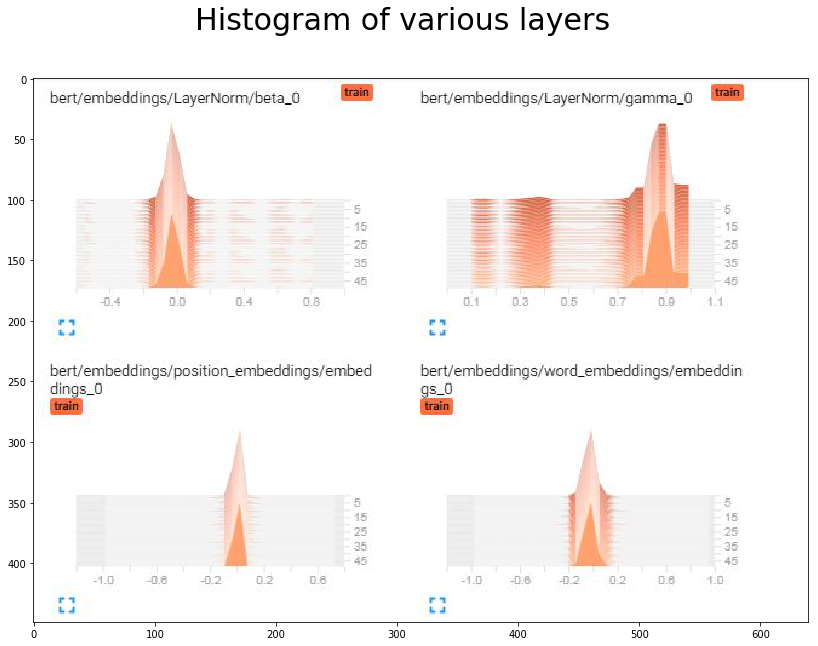

In [18]:
fig=plt.figure(figsize=(20,10))
fig.suptitle('Histogram of various layers',fontsize=30)
plt.subplot(1,1,1)
plt.imshow(img1)

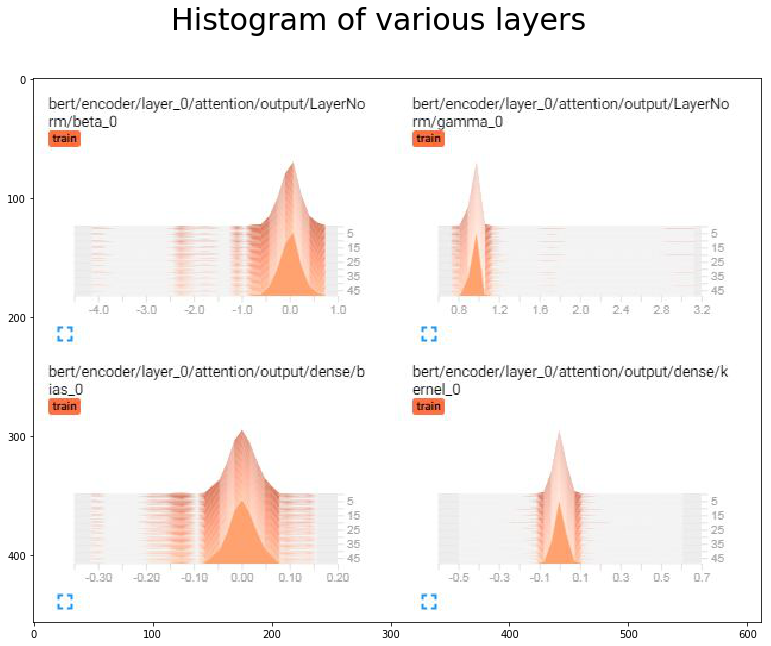

In [19]:
fig=plt.figure(figsize=(20,10))
fig.suptitle('Histogram of various layers',fontsize=30)
plt.subplot(1,1,1)
plt.imshow(img2)

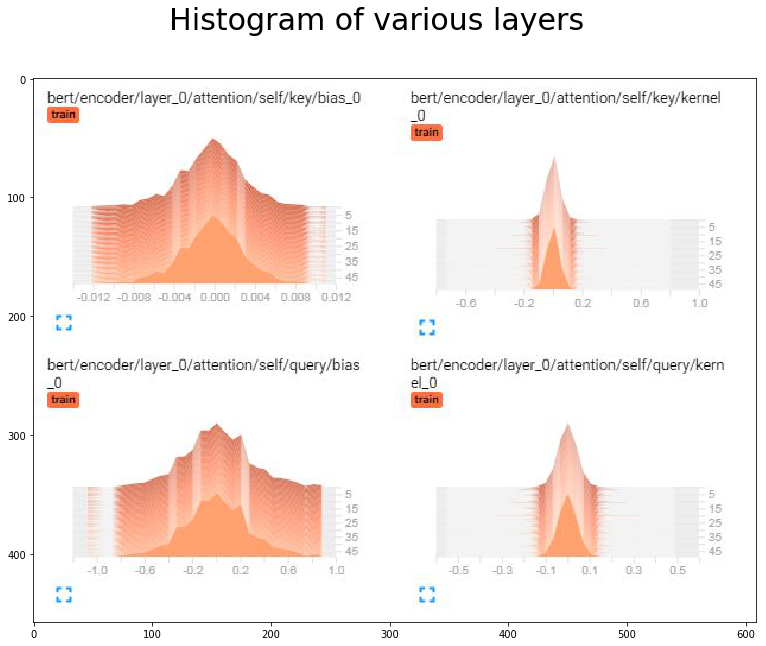

In [20]:
fig=plt.figure(figsize=(20,10))
fig.suptitle('Histogram of various layers',fontsize=30)
plt.subplot(1,1,1)
plt.imshow(img3)

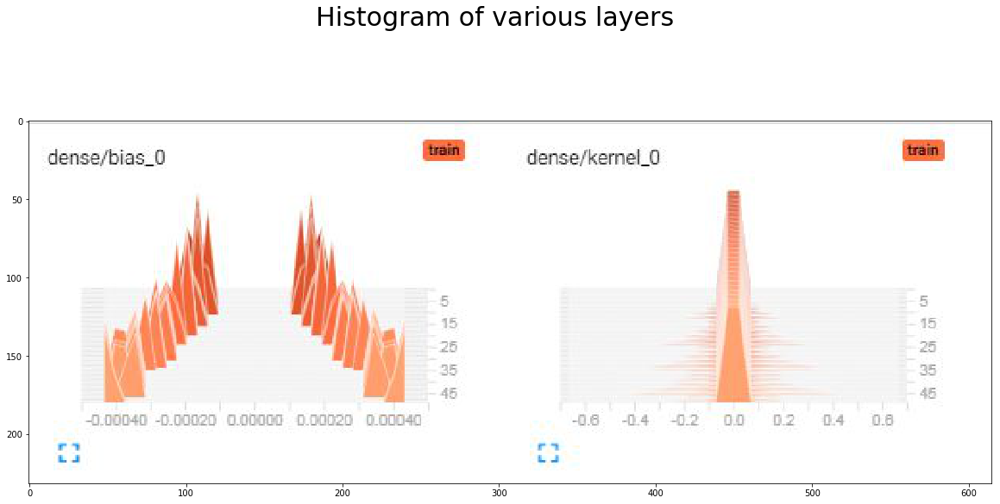

In [21]:
fig=plt.figure(figsize=(20,10))
fig.suptitle('Histogram of various layers',fontsize=30)
plt.subplot(1,1,1)
plt.imshow(img4)

# **SUMMARY**

In [2]:
from prettytable import PrettyTable
    
x = PrettyTable()

x.field_names = ["Model","Model Type","Train loss","Test loss","Train Accuracy","Test Accuracy"]

x.add_row([ "Model 1","Baseline Model",0.6679,0.7345,0.6238,0.5406])
x.add_row([ "Model 2", "BERT Embeddings Model",0.6934,0.6936,0.5546,0.5412])

print(x)

+---------+-----------------------+------------+-----------+----------------+---------------+
|  Model  |       Model Type      | Train loss | Test loss | Train Accuracy | Test Accuracy |
+---------+-----------------------+------------+-----------+----------------+---------------+
| Model 1 |     Baseline Model    |   0.6679   |   0.7345  |     0.6238     |     0.5406    |
| Model 2 | BERT Embeddings Model |   0.6934   |   0.6936  |     0.5546     |     0.5412    |
+---------+-----------------------+------------+-----------+----------------+---------------+
